In [1]:
from read_ica import read_ica

In [2]:
import os
import mne
import numpy as np
from scipy.io.wavfile import read as read_wav
import librosa

import librosa.display
import matplotlib.pyplot as plt
from ipywidgets import IntProgress
from IPython.display import display, Audio

# Read Music stimuli

This directory contains the audio stimuli and cues.

-   cues.v1 - version 1 of the cue clicks (P01-P08)

-   cues.v2 - version 2 of the cue clicks (P09-P14)

-   full.v1 - version 1 of the full stimuli including cue clicks (P01-P08)

-   full.v2 - version 2 of the full stimuli including cue clicks (P09-P14)

In [3]:
stimuli_path = f'data/openmiir/audio/full.'
# stimuli_path_cue = f'data/openmiir/audio/cues.'
beats_path = f'data/openmiir/meta/beats.'

In [4]:
def load_beat_from_metadata(music_id, version, rate):
    beats = open(os.path.join(beats_path + version, f'{int(music_id)}_beats.txt')).readlines()
    # cue = open(os.path.join(beats_path + version, f'{int(music_id)}_cue_beats.txt')).readlines()

    offset = float(beats[0].rsplit(' ', 1)[-1])
    beats = np.asarray(list(map(lambda x: float(x), beats[1:])))
    # cue = np.asarray(list(map(lambda x: float(x), cue)))

    beat = (beats + offset) * rate  # For Perception & Imagination (beat start after cue)
    beat_woc = beats * rate  # For Uncue imagination
    
    return beat, beat_woc, offset

In [5]:
def onset_detect(wav, rate, offset=0, interval=None, tempo=None):
    if interval == None and tempo is not None:
        interval = 60/(tempo*4)  # 4 note per beat
    interval = int(rate * interval)
    D = librosa.stft(wav[offset:])
    H, P = librosa.decompose.hpss(D, margin=3.0)
    # R = D - (H + P)
    wav_harm = librosa.istft(H)
    wav_perc = librosa.istft(P)
    # wav_resi = librosa.istft(R)
    
    onset = np.asarray(list(
        set(librosa.onset.onset_detect(y=wav_harm.astype(float), sr=rate, units='samples'))
        # .union(set(librosa.onset.onset_detect(y=wav_perc.astype(float), sr=rate, units='samples')))
        # .union(set(librosa.onset.onset_detect(y=wav_resi.astype(float), sr=rate, units='samples')))
    ))
    onset.sort()
    
    # return onset
    
    last = None
    clean_onset = []
    for s in onset:
        if last is None or s - last > interval:
            clean_onset.append(s)
            last = s
    clean_onset_woc = np.asarray(clean_onset)  # For Uncue imagination
    clean_onset = clean_onset_woc + offset  # For Perception & Imagination (beat start after cue)
    
    return clean_onset, clean_onset_woc
        

ID: 01(v1) Name: Chim Chim Cheree lyrics


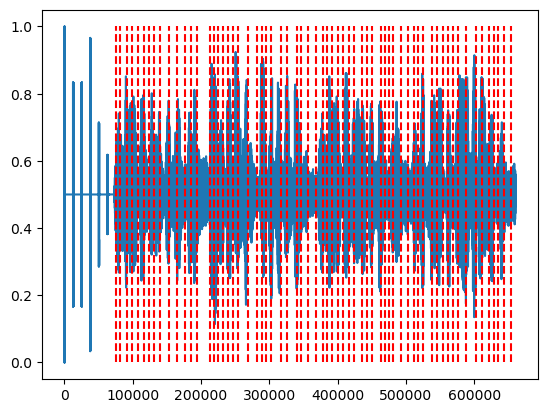

ID: 02(v1) Name: Take Me Out To The Ballgame lyrics


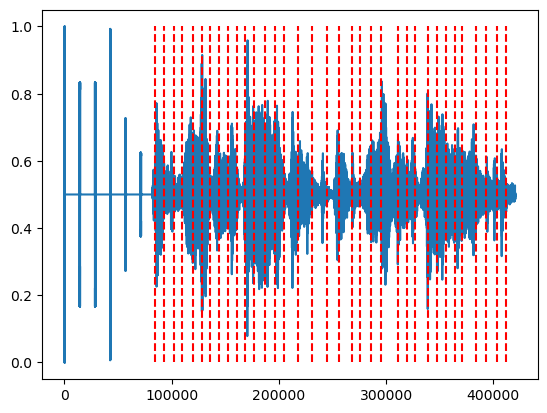

ID: 03(v1) Name: Jingle Bells lyrics


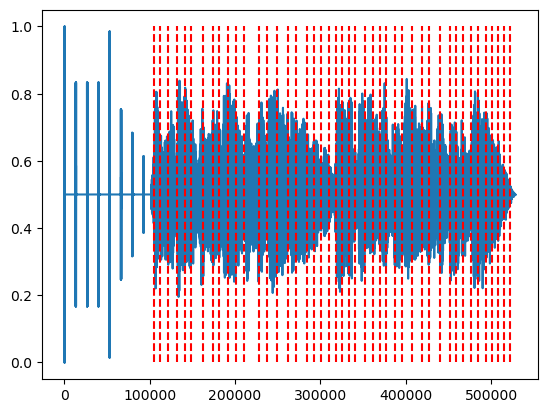

ID: 04(v1) Name: Mary Had A Little Lamb lyrics


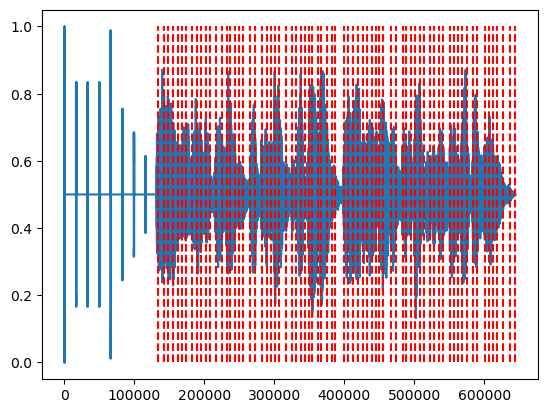

ID: 11(v1) Name: Chim Chim Cheree no lyrics


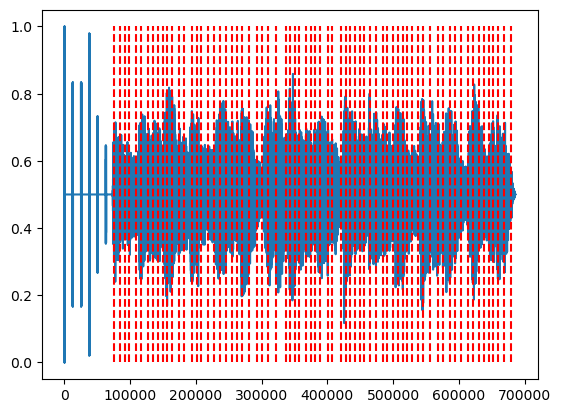

ID: 12(v1) Name: Take Me Out To The Ballgame no lyrics


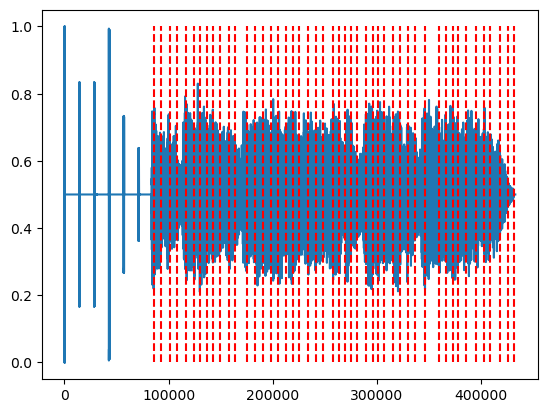

ID: 13(v1) Name: Jingle Bells no lyrics


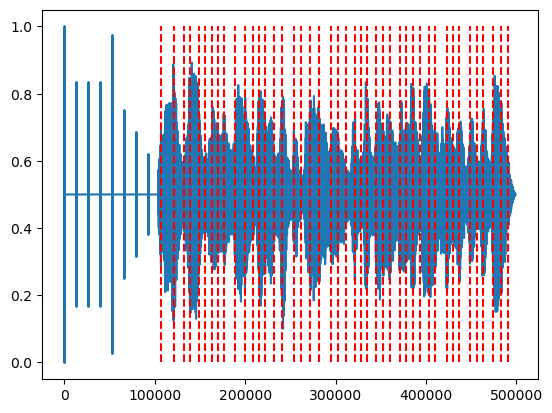

ID: 14(v1) Name: Mary Had A Little Lamb no lyrics


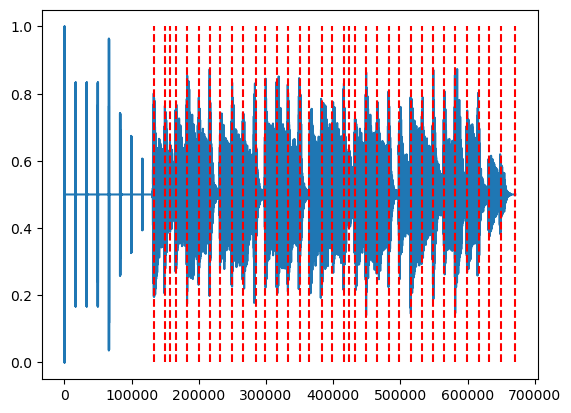

ID: 21(v1) Name: EmperorWaltz


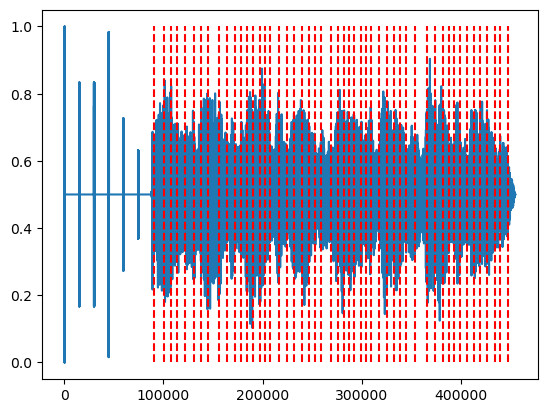

ID: 22(v1) Name: Harry Potter Theme


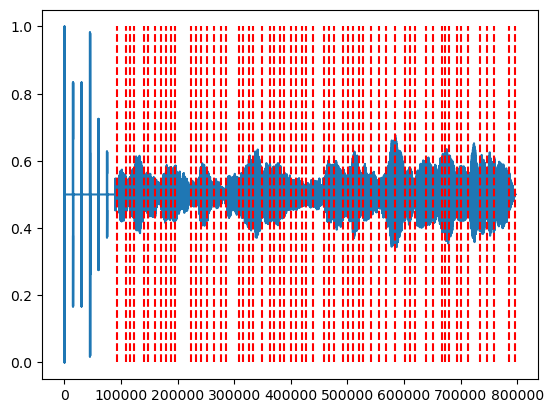

ID: 23(v1) Name: Star Wars Theme


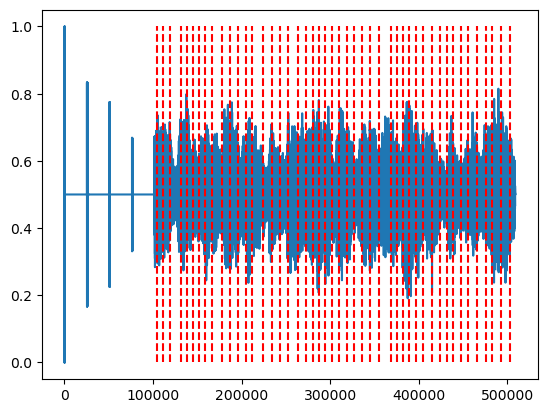

ID: 24(v1) Name: Eine kleine Nachtmusic


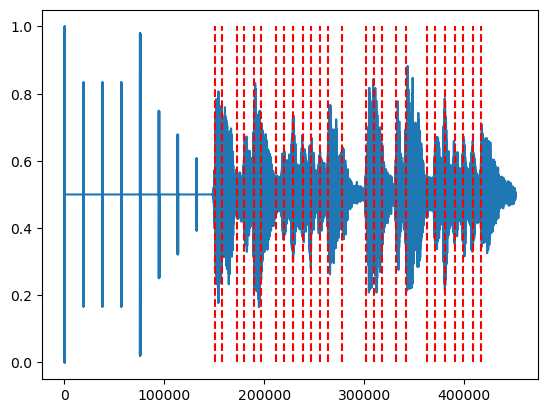

ID: 01(v2) Name: Chim Chim Cheree lyrics


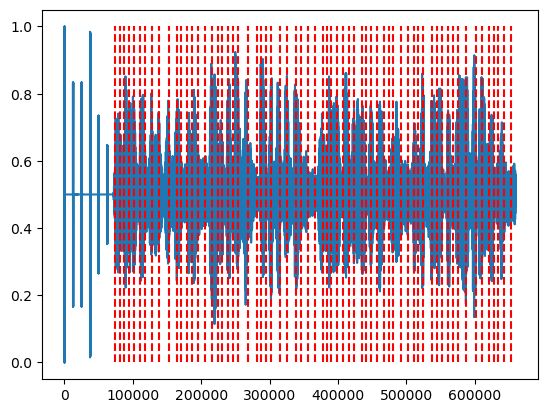

ID: 02(v2) Name: Take Me Out To The Ballgame lyrics


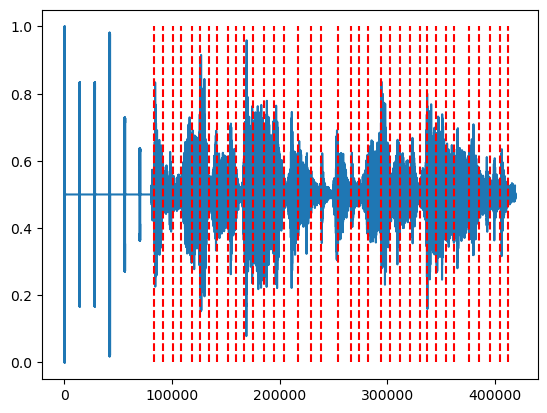

ID: 03(v2) Name: Jingle Bells lyrics


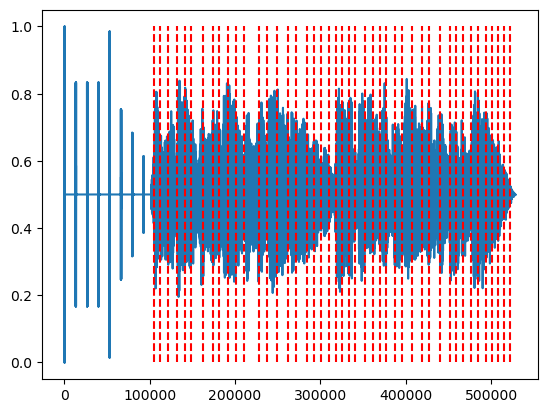

ID: 04(v2) Name: Mary Had A Little Lamb lyrics


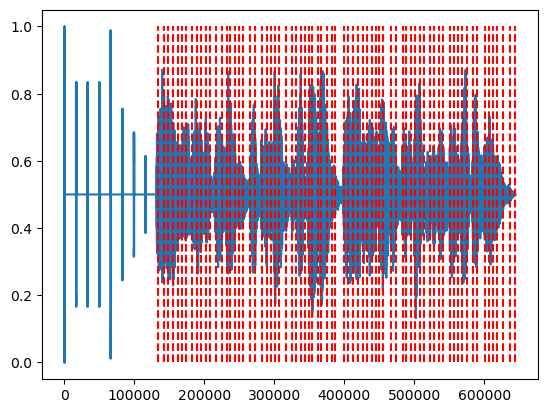

ID: 11(v2) Name: Chim Chim Cheree no lyrics


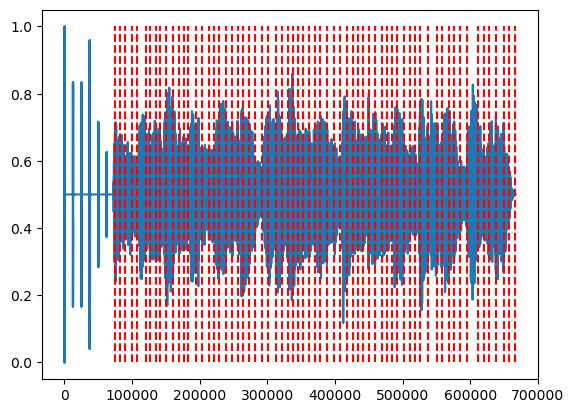

ID: 12(v2) Name: Take Me Out To The Ballgame no lyrics


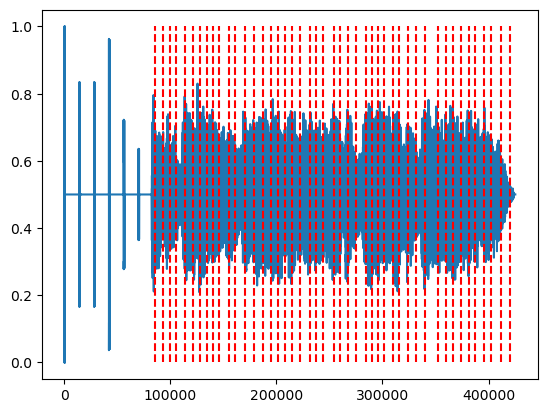

ID: 13(v2) Name: Jingle Bells no lyrics


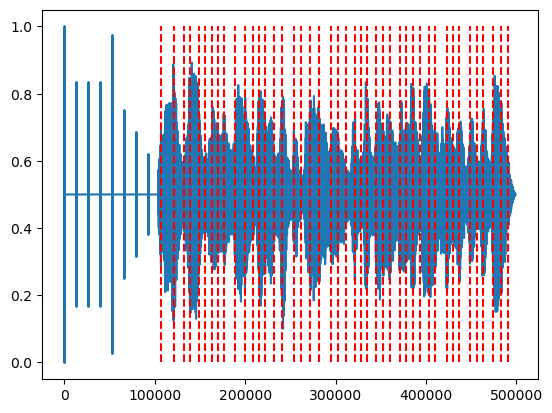

ID: 14(v2) Name: Mary Had A Little Lamb no lyrics


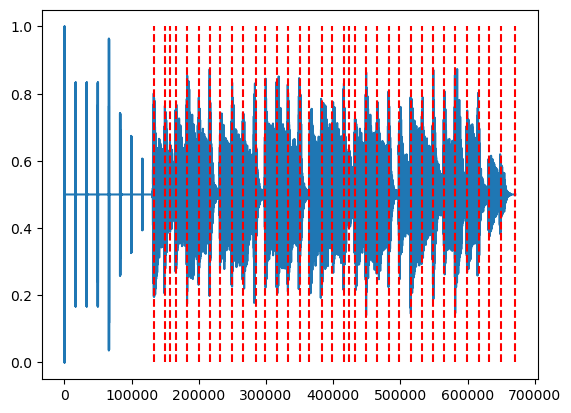

ID: 21(v2) Name: EmperorWaltz


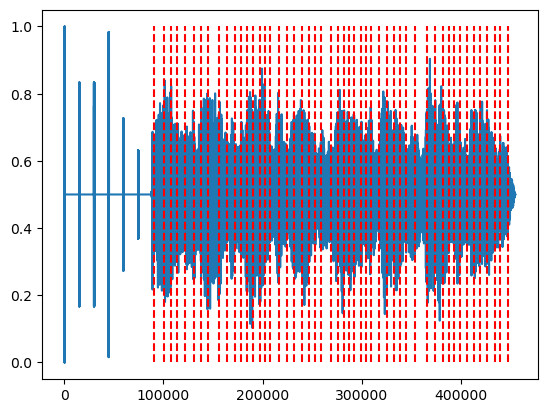

ID: 22(v2) Name: Harry Potter Theme


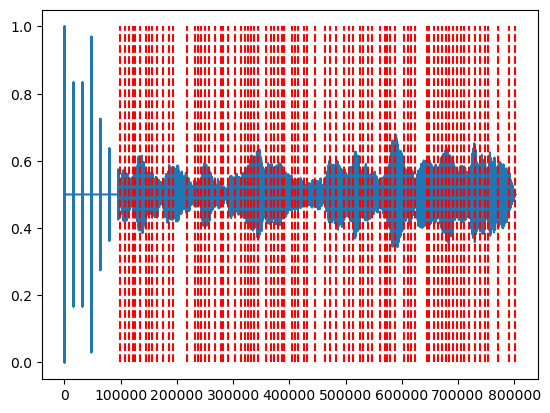

ID: 23(v2) Name: Star Wars Theme


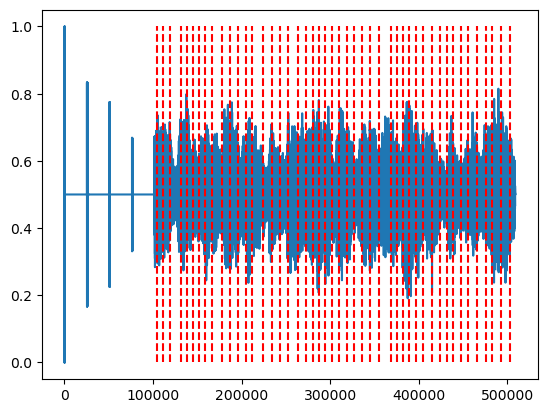

ID: 24(v2) Name: Eine kleine Nachtmusic


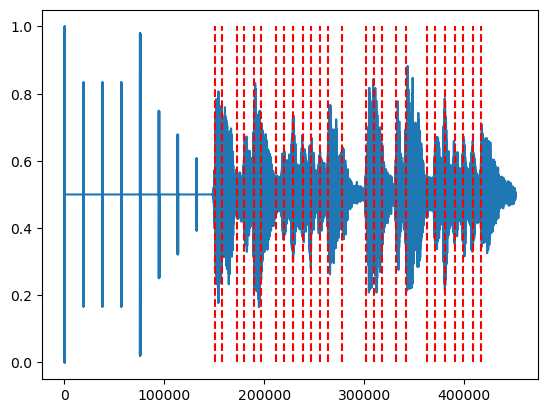

In [6]:
musics = dict(v1=dict(), v2=dict())
# musics_cue = dict(v1=dict(), v2=dict())
musics_list = []
for version in ['v1', 'v2']:
    for _, _, files in os.walk(stimuli_path + version):
        for fn in files:
            if not fn.endswith('wav'):
                continue

            mid = fn[1:3]
            desc = ' '.join(fn[:-4].split('_')[1:])
            rate, wav = read_wav(os.path.join(stimuli_path + version, fn))  # Stereo
            wav = wav.mean(axis=1)
            wav = (wav - wav.min())/(wav.max()-wav.min())  # Normalize

            beat, beat_woc, offset = load_beat_from_metadata(mid, version, rate)

            offset_sample = np.round(offset*rate).astype(int)

            tempo = np.round(librosa.feature.tempo(y=wav[offset_sample:], sr=rate)[0])
            onset, onset_woc = onset_detect(wav, rate, tempo=tempo, offset=offset_sample)

            musics_list.append(mid)
            musics[version][mid] = dict(
                wav=wav,
                rate=rate,
                time=wav.shape[0]/rate,
                sample=wav.shape[0],
                offset=offset,
                onset=onset,
                onset_woc=onset_woc,
                beat=beat,
                beat_woc=beat_woc,
                desc=desc,
            )

            print(f'ID: {mid}({version}) Name: {desc}')
            clicks = librosa.clicks(times=onset/rate, sr=rate, length=len(wav))
            # display(Audio(data=wav + clicks, rate=rate))
            plt.plot(wav)
            plt.vlines(onset, 0, wav.max()*1, color='red', linestyle='--')
            plt.show()

            
# for version in ['v1', 'v2']:
#     for _, _, files in os.walk(stimuli_path_cue + version):
#         for fn in files:
#             if not fn.endswith('wav'):
#                 continue

#             mid = fn[1:3]
#             desc = ' '.join(fn[:-4].split('_')[1:])
#             rate, wav = read_wav(os.path.join(stimuli_path_cue + version, fn))  # Mono
#             wav = (wav - wav.min())/(wav.max()-wav.min())  # Normalize
#             musics_cue[version][mid] = dict(
#                 wav=wav,
#                 rate=rate,
#                 time=wav.shape[0]/rate,
#                 sample=wav.shape[0],
#                 desc=desc,
#             )

Onsets


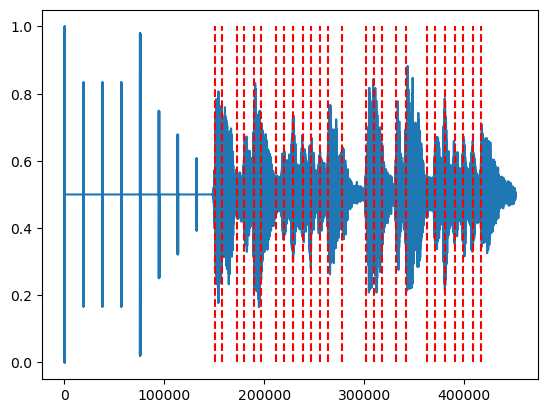

Beats


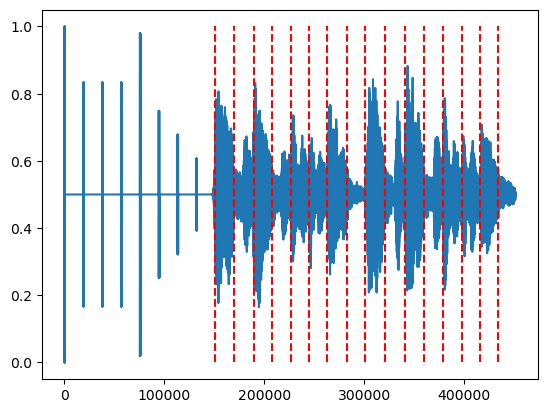

In [42]:
sid = '24'
wav = musics['v1'][sid]['wav']
rate = musics['v1'][sid]['rate']
onset = musics['v1'][sid]['onset_woc'] + musics['v1'][sid]['offset'] * rate
beat = musics['v1'][sid]['beat_woc'] + musics['v1'][sid]['offset'] * rate

print('Onsets')
clicks = librosa.clicks(times=onset/rate, sr=rate, length=len(wav))
display(Audio(data=wav + clicks, rate=rate))
plt.plot(wav)
plt.vlines(onset, 0, wav.max()*1, color='red', linestyle='--')
plt.show()
print('Beats')
clicks = librosa.clicks(times=beat/rate, sr=rate, length=len(wav))
display(Audio(data=wav + clicks, rate=rate))
plt.plot(wav)
plt.vlines(beat, 0, wav.max()*1, color='red', linestyle='--')
plt.show()

## Save

In [7]:
np.save('omiir_music.npy', musics)

In [8]:
# np.load('omiir_music.npy', allow_pickle=True).item()

# Sample (SUB_ID: 01)

## Read EEG

In [9]:
SUB_ID = '01'
VERSION = 'v1' if int(SUB_ID) <= 8 else 'v2'
RAW_FILE_PATH = f'data/openmiir/eeg/mne/P{SUB_ID}-raw.fif'
ICA_FILE_PATH = f'data/openmiir/eeg/preprocessing/ica/P{SUB_ID}-100p_64c-ica.fif'

In [10]:
raw = mne.io.read_raw_fif(RAW_FILE_PATH).set_montage('biosemi64')
ica = read_ica(ICA_FILE_PATH)
sample_preprocessed = ica.apply(raw.copy().load_data()).interpolate_bads().filter(l_freq=0.5, h_freq=45)
events = mne.find_events(sample_preprocessed)
org_freq = sample_preprocessed.info['sfreq']
sample_preprocessed = sample_preprocessed.resample(64)
sfreq = sample_preprocessed.info['sfreq']
sample_preprocessed

Opening raw data file data/openmiir/eeg/mne/P01-raw.fif...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
Now restoring ICA solution ...
Reading 0 ... 2478165  =      0.000 ...  4840.166 secs...
Applying ICA to Raw instance
    Transforming to ICA space (61 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components
Interpolating bad channels
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 61 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    3.0s finished


506 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


<Raw | P01-raw.fif, 69 x 309771 (4840.2 s), ~163.2 MB, data loaded>

### Recompute Event from downsampling

__Event Description__  
_XXX # Music-id (XX) + Trial Type (X)  
1000  # Audio Onset  
1001  # Perception trial onset  (Note: Not exists in data)  
1002  # Cued imagination trial onset  (Note: Not exists in data)  
1003  # Uncued imagination trial onset  (Note: Not exists in data)  
1111  # Noise "trial" onset  
2001  # Listening with feedback
([Ref](https://github.com/sstober/deepthought/blob/master/deepthought/datasets/openmiir/preprocessing/events.py#L149))

In [11]:
def sep_eid(eid):
    '''
        Return:
            music_id (str), trial_type (int)
    '''
    return f'{int(str(eid)[:-1]):02d}', int(str(eid)[-1:])

In [12]:
ch_stim = mne.pick_types(sample_preprocessed.info, stim=True)[0]

last_idx = 0
new_stimuli = []
end_of_events = 0
for start, _, eid in events:
    _, trial_type = sep_eid(eid)
    if eid < 1000:
        event_id = eid
        mid, trial_type = sep_eid(eid)
    if eid == 1000:
        start_idx = np.round(start/org_freq*sfreq).astype(int)
        new_stimuli.append(np.zeros(start_idx - last_idx))
        new_stimuli.append([event_id])
        last_idx = start_idx + 1
    if trial_type == 4:
        end_of_events = start
        break

sample_preprocessed = sample_preprocessed.crop(tmax=end_of_events/org_freq)  # Crop until trial_type 4
new_stimuli.append(np.zeros(sample_preprocessed.last_samp - last_idx + 1))  # Fill until end of trial
new_stimuli = np.concatenate(new_stimuli)

# Replace Stimuli Channel
sample_preprocessed._data[ch_stim] = new_stimuli

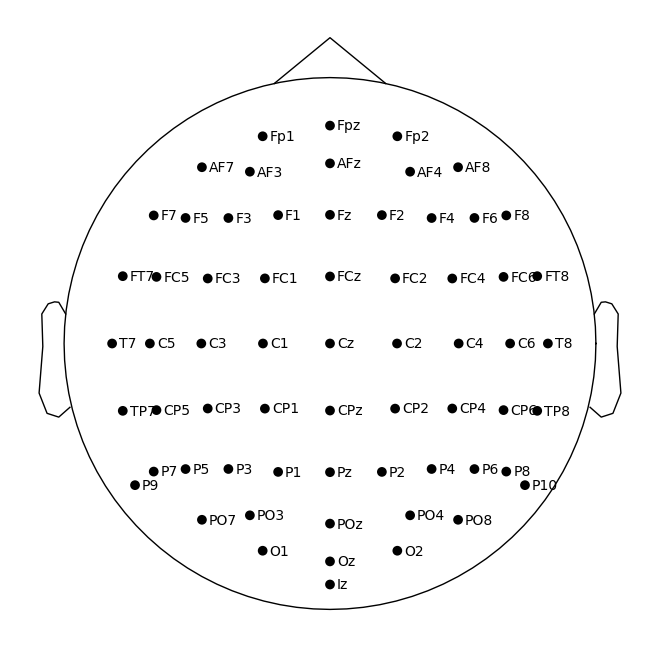

In [13]:
%matplotlib inline
sample_preprocessed.plot_sensors(show_names=True);

Using matplotlib as 2D backend.


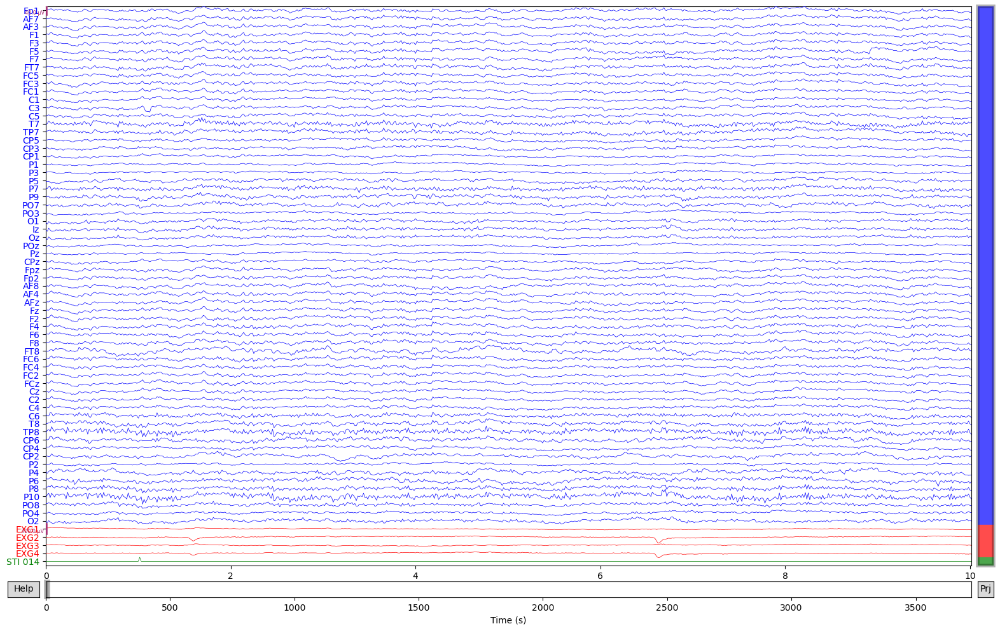

In [14]:
%matplotlib inline

color = dict(eeg='blue', eog='red', stim='green')
sample_preprocessed.plot(n_channels=69, remove_dc=True, color=color);

## Find Events

In [15]:
sample_events = mne.find_events(sample_preprocessed)

180 events found
Event IDs: [ 11  12  13  21  22  23  31  32  33  41  42  43 111 112 113 121 122 123
 131 132 133 141 142 143 211 212 213 221 222 223 231 232 233 241 242 243]


### Separate events by type

The EEG experiment was divided into 2 parts with 5 blocks.
A single block comprised of all 12 stimuli in randomized order.  

| ID | Name | Meter | Length | Tempo |  
|---|---|---|---|---|
| 1 | Chim Chim Cheree (lyrics) | 3/4 | 13.3s | 212 BPM
| 2 | TakeMe Out to the Ballgame (lyrics) | 3/4 | 7.7s | 189 BPM
| 3 | Jingle Bells (lyrics) | 4/4 | 9.7s | 200 BPM
| 4 | Mary Had a Little Lamb (lyrics) | 4/4 | 11.6s | 160 BPM
| 11 | Chim Chim Cheree | 3/4 | 13.5s | 212 BPM
| 12 | TakeMe Out to the Ballgame | 3/4 | 7.7s | 189 BPM
| 13 | Jingle Bells | 4/4 | 9.0s | 200 BPM
| 14 | Mary Had a Little Lamb | 4/4 | 12.2s | 160 BPM
| 21 | EmperorWaltz | 3/4 | 8.3s | 178 BPM
| 22 | Hedwig’s Theme (Harry Potter) | 3/4 | 16.0s | 166 BPM
| 23 | ImperialMarch (StarWars Theme) | 4/4 | 9.2s | 104 BPM
| 24 | Eine Kleine Nachtmusik | 4/4 | 6.9s | 140 BPM
| | mean | | 10.4s | 176 BPM

Information about the tempo, meter and length of the stimuli (without cue clicks) used in this study.  

Between blocks, participants could take breaks at their own pace. We recorded EEG in 4 conditions:

1. Stimulus perception preceded by cue clicks
2. Stimulus imagination preceded by cue clicks
3. Stimulus imagination without cue clicks
4. Stimulus imagination without cue clicks, with feedback

The event markers recorded in the raw EEG comprise:

• Trial labels (as a concatenation of stimulus ID and condition) at the beginning of each trial  
• Exact audio onsets for the first cue click of each trial in conditions 1 and 2 (detected by the Stimtracker)  
• Subject feedback for the condition 4 trials (separate event IDs for positive and negative feedback)  

C:\Users\Paul\AppData\Local\Temp\ipykernel_105052\729493090.py:4: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  _ = mne.viz.plot_events(sample_events, sfreq=raw.info['sfreq'], axes=ax)


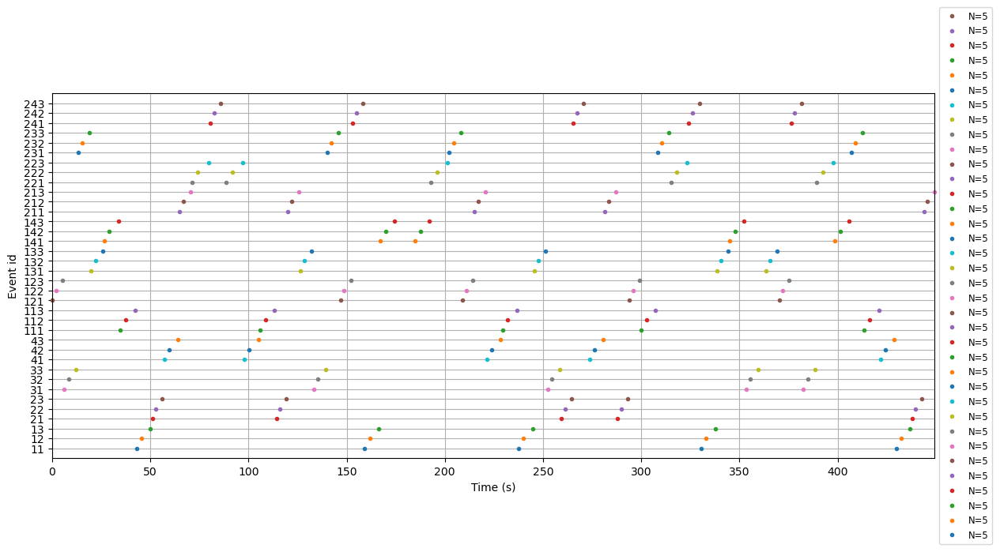

In [16]:
%matplotlib inline
fig = plt.figure(figsize=(16, 6))
ax = fig.subplots()
_ = mne.viz.plot_events(sample_events, sfreq=raw.info['sfreq'], axes=ax)

In [17]:
sample_eid_perception = []
sample_eid_imagination = []
sample_eid_imagination_woc = []
for _, _, eid in sample_events:
    _, trial_type = sep_eid(eid)
    if trial_type == 1:
        sample_eid_perception.append(eid)
    elif trial_type == 2:
        sample_eid_imagination.append(eid)
    elif trial_type == 3:
        sample_eid_imagination_woc.append(eid)

In [18]:
sample_evt_perception = sample_events[np.isin(sample_events[:, 2], sample_eid_perception)]
sample_evt_imagination = sample_events[np.isin(sample_events[:, 2], sample_eid_imagination)]
sample_evt_imagination_woc = sample_events[np.isin(sample_events[:, 2], sample_eid_imagination_woc)]
sample_evt_all = sample_events[np.isin(sample_events[:, 2], sample_eid_perception + sample_eid_imagination + sample_eid_imagination_woc)]

## Explore Perception vs Imagination

In [19]:
tmin = np.max([m['offset'] for _, m in musics[VERSION].items()])
tmax = np.min([m['time'] for _, m in musics[VERSION].items()])
tmin, tmax  # After Cue to End of Musics

(3.365, 9.535215419501133)

Not setting metadata
60 matching events found
No baseline correction applied
1 projection items activated
Not setting metadata
60 matching events found
No baseline correction applied
1 projection items activated
Not setting metadata
60 matching events found
No baseline correction applied
1 projection items activated
Using data from preloaded Raw for 60 events and 396 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 60 events and 396 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 60 events and 396 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Averaging across epochs...
Averaging across epochs...
Averaging across epochs...
Averaging across epochs...


D:\Anaconda3\Lib\site-packages\mne\viz\utils.py:161: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


Averaging across epochs...


(0.0, 50.0)

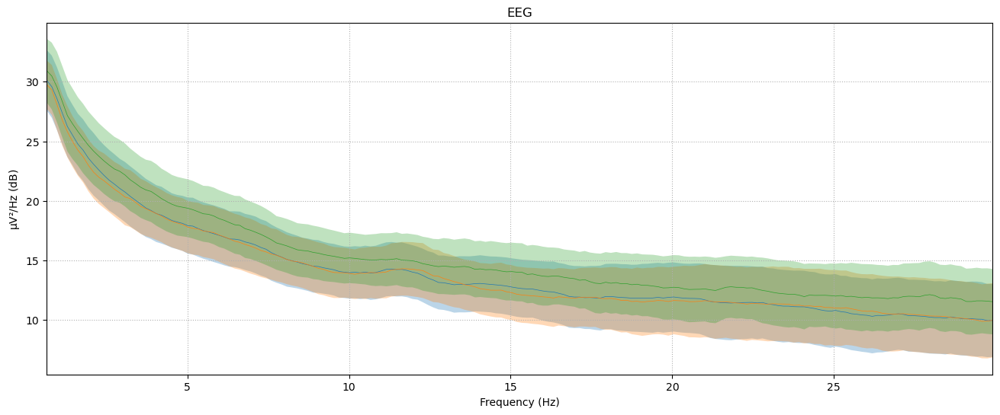

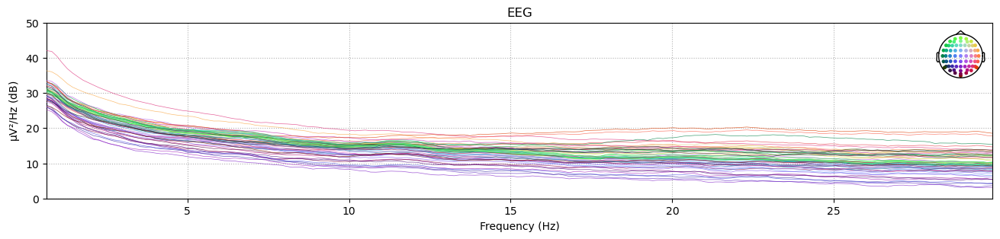

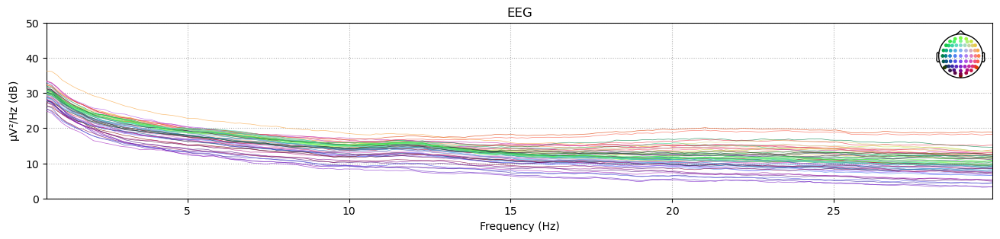

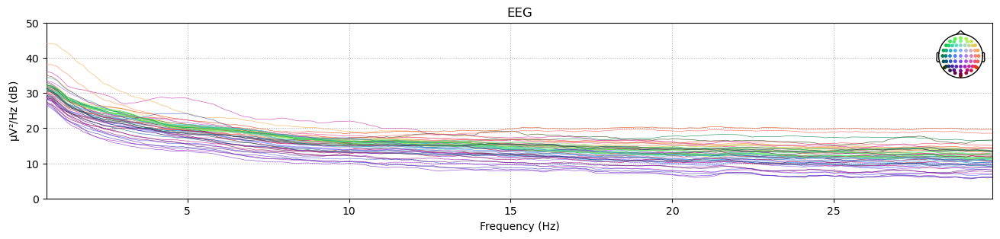

In [20]:
epc_perc = mne.Epochs(sample_preprocessed, sample_evt_perception, tmin=tmin, tmax=tmax, baseline=None, picks='eeg')
epc_imag = mne.Epochs(sample_preprocessed, sample_evt_imagination, tmin=tmin, tmax=tmax, baseline=None, picks='eeg')
epc_imag_woc = mne.Epochs(sample_preprocessed, sample_evt_imagination_woc, tmin=tmin, tmax=tmax, baseline=None, picks='eeg')

psd_perc = epc_perc.compute_psd(fmin=0.5, fmax=30)
psd_imag = epc_imag.compute_psd(fmin=0.5, fmax=30)
psd_imag_woc = epc_imag_woc.compute_psd(fmin=0.5, fmax=30)

%matplotlib inline

fig = plt.figure(figsize=(16, 6))
ax = fig.subplots()
psd_perc.plot(average=True, color='tab:blue', axes=ax);
psd_imag.plot(average=True, color='tab:orange', axes=ax);
psd_imag_woc.plot(average=True, color='tab:green', axes=ax);

fig1 = plt.figure(figsize=(16, 3))
ax1 = fig1.subplots()
psd_perc.plot(axes=ax1);
ax1.set_ylim(0, 50)

fig2 = plt.figure(figsize=(16, 3))
ax2 = fig2.subplots()
psd_imag.plot(axes=ax2);
ax2.set_ylim(0, 50)

fig3 = plt.figure(figsize=(16, 3))
ax3 = fig3.subplots()
psd_imag_woc.plot(axes=ax3);
ax3.set_ylim(0, 50)

# fig4 = plt.figure(figsize=(16, 6))
# ax4 = fig4.subplots(nrows=3, ncols=5)
# psd_perc.plot_topomap(axes=ax4[0]);
# psd_imag.plot_topomap(axes=ax4[1]);
# psd_imag_woc.plot_topomap(axes=ax4[2]);

## Explore Before/After Start

In [21]:
def shift_event_cue(events):
    shifted_events = []
    for start, _, eid in events:
        mid, trial_type = sep_eid(eid)
        shifted = np.round(musics[VERSION][mid]['offset']*sfreq).astype(int) + start
        shifted_events.append(shifted)
    shifted_events = np.asarray(shifted_events)
    copy = events.copy()
    copy[:, 0] = shifted_events
    
    return copy

In [22]:
tmin_ = -1.0
tmax_ = 3.0

Not setting metadata
60 matching events found
No baseline correction applied
1 projection items activated
Not setting metadata
60 matching events found
No baseline correction applied
1 projection items activated
Not setting metadata
60 matching events found
No baseline correction applied
1 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Removing projector <Projection | Average EEG reference, active : True, n_channels : 64>


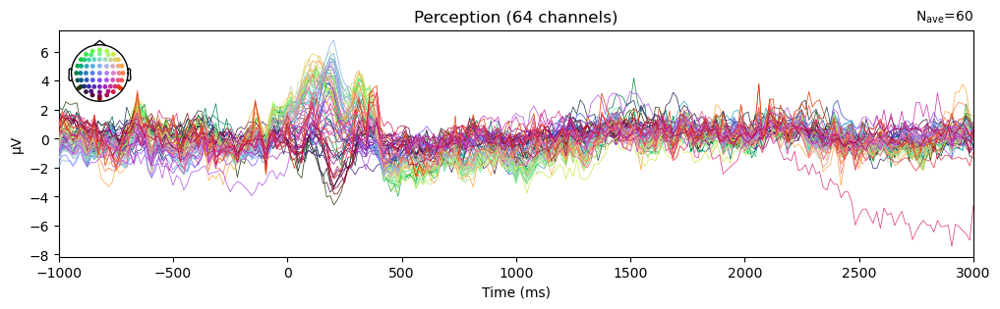

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Removing projector <Projection | Average EEG reference, active : True, n_channels : 64>


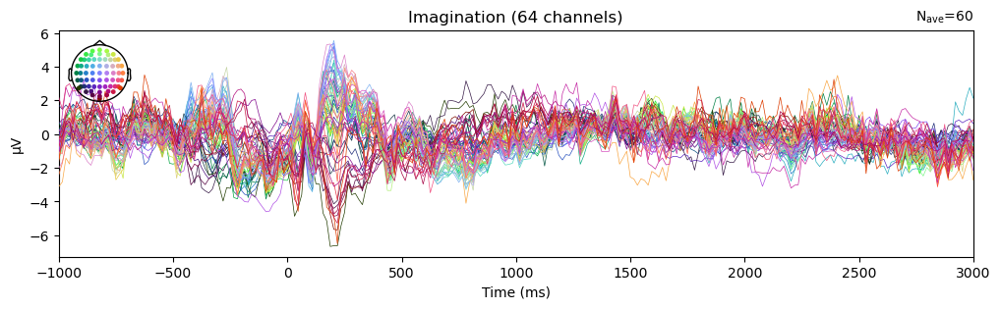

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Removing projector <Projection | Average EEG reference, active : True, n_channels : 64>


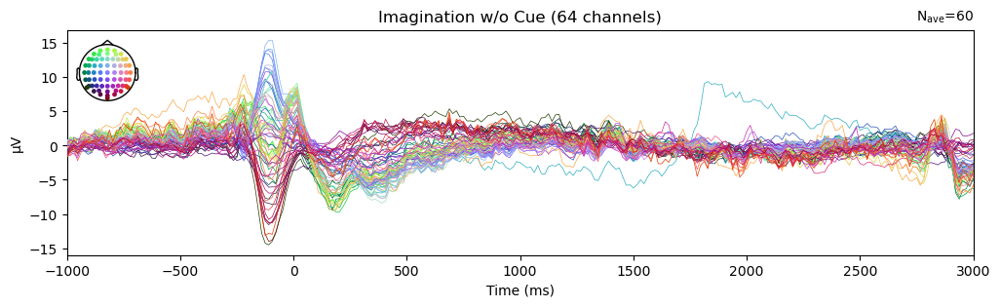

In [24]:
ex_ba_perc = mne.Epochs(sample_preprocessed, shift_event_cue(sample_evt_perception), tmin=tmin_, tmax=tmax_, baseline=None, picks='eeg')
ex_ba_imag = mne.Epochs(sample_preprocessed, sample_evt_imagination, tmin=tmin_, tmax=tmax_, baseline=None, picks='eeg')
ex_ba_imag_woc = mne.Epochs(sample_preprocessed, sample_evt_imagination_woc, tmin=tmin_, tmax=tmax_, baseline=None, picks='eeg')

%matplotlib inline

fig1 = plt.figure(figsize=(12, 3))
ax1 = fig1.subplots()
ex_ba_perc.average(picks='data').plot(titles='Perception', time_unit="ms", axes=ax1);

fig2 = plt.figure(figsize=(12, 3))
ax2 = fig2.subplots()
ex_ba_imag.average(picks='data').plot(titles='Imagination', time_unit="ms", axes=ax2);

fig3 = plt.figure(figsize=(12, 3))
ax3 = fig3.subplots()
ex_ba_imag_woc.average(picks='data').plot(titles='Imagination w/o Cue', time_unit="ms", axes=ax3);

## Filter Data for Musics Only

Creating RawArray with float64 data, n_channels=69, n_times=147030
    Range : 0 ... 147029 =      0.000 ...  2297.328 secs
Ready.


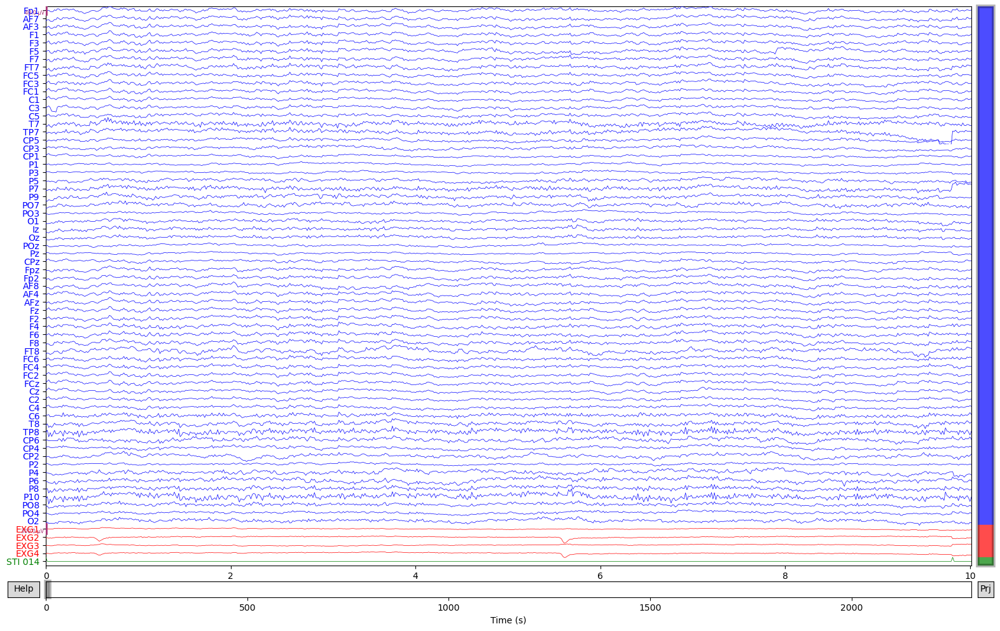

In [24]:
filter_data = []
for start, _, eid in sample_events:
    mid, trial_type = sep_eid(eid)
    stop = np.round(musics[VERSION][mid]['time'] * sfreq).astype(int)
    filter_data.append(sample_preprocessed.get_data(picks='all', start=start, stop=start + stop))
    
filter_data = np.concatenate(filter_data, axis=1)
new_raw = mne.io.RawArray(filter_data.astype('object'), sample_preprocessed.info)  # .astype('object') is workaround solution from error with numpy version

new_raw.plot(n_channels=69, color=color);

# Create Dataset from All Subjects

Available subject 01, 04, 06, 07 | 09, 11, 12, 13, 14  
Note:
- Not sure why `SUB05` ica save as 01, but results from `SUB01` looks exactly the same with original notebooks.  
- Fixing error with `EXG5-6` by set eeg reference [ref](https://github.com/sstober/deepthought/blob/master/deepthought/datasets/openmiir/preprocessing/pipeline.py#L76)  

In [25]:
def sep_eid_v2(eid):
    '''
        Return:
            music_id (str), trial_type (int), version (str)
    '''
    return f'{int(str(eid)[:-2]):02d}', int(str(eid)[-2]), f'v{str(eid)[-1]}'

In [26]:
target_sfreq = 64
all_musics_data = []
SUBJECTS = ['01', '04', '06', '07', '09', '11', '12', '13', '14']
subid_channel = []

progress = IntProgress(min=0, max=len(SUBJECTS))
display(progress)

for SUB_ID in SUBJECTS:
    progress.description = f'SUB: {SUB_ID} ({progress.value}/{len(SUBJECTS)})'
    
    VS = 1 if int(SUB_ID) <= 8 else 2
    VERSION = 'v1' if int(SUB_ID) <= 8 else 'v2'
    RAW_FILE_PATH = f'data/openmiir/eeg/mne/P{SUB_ID}-raw.fif'
    ICA_FILE_PATH = f'data/openmiir/eeg/preprocessing/ica/P{SUB_ID}-100p_64c-ica.fif'

    raw = mne.io.read_raw_fif(RAW_FILE_PATH).load_data()
    
    # See Note 2.
    if 'EXG5' in raw.ch_names and 'EXG6' in raw.ch_names:
        raw.set_eeg_reference(ref_channels=['EXG5', 'EXG6'])
        raw.drop_channels(['EXG5', 'EXG6'])
    raw.set_montage('biosemi64')
    ica = read_ica(ICA_FILE_PATH)
    preprocessed = ica.apply(raw.copy().load_data()).interpolate_bads().filter(l_freq=0.5, h_freq=45)
    events = mne.find_events(preprocessed)
    org_freq = preprocessed.info['sfreq']
    preprocessed = preprocessed.resample(target_sfreq)  # Downsampling
    sfreq = preprocessed.info['sfreq']

    ch_stim = mne.pick_types(preprocessed.info, stim=True)[0]

    # Fix events from downsampling
    last_idx = 0
    new_stimuli = []
    end_of_events = 0
    for start, _, eid in events:
        if eid < 1000:  # Get music-id from start of trial
            event_id = eid
            mid, trial_type = sep_eid(eid)
        if eid == 1000:  # At real onset
            start_idx = np.round(start/org_freq*sfreq).astype(int)  # Calculate a new place at downsampling frequency
            new_stimuli.append(np.zeros(start_idx - last_idx))  # Fill with no event samples
            new_stimuli.append([event_id * 10 + VS])  # Fill with event-id sample
            last_idx = start_idx + 1
        if trial_type == 4:
            end_of_events = start
            break
    
    preprocessed = preprocessed.crop(tmax=end_of_events/org_freq)  # Crop until trial_type 4
    new_stimuli.append(np.zeros(preprocessed.last_samp - last_idx + 1))  # Fill until end of trial
    new_stimuli = np.concatenate(new_stimuli)

    # Replace Stimuli Channel
    preprocessed._data[ch_stim] = new_stimuli
    events = mne.find_events(preprocessed)
    
    # Crop start/stop of musics
    for (start, _, eid), next_start in zip(events, np.concatenate([events[1:, 0], [preprocessed.last_samp]])):  # Add next_start
        mid, trial_type, version = sep_eid_v2(eid)
        stop = np.round(musics[version][mid]['time'] * sfreq).astype(int)
        if trial_type > 1:
            if next_start < start + stop:
                print(f'{trial_type} shorter ({(start + stop - next_start)/sfreq:.2f} secs)')
            elif next_start > start + stop:
                print(f'{trial_type} longer ({(next_start - start - stop)/sfreq:.2f} secs)')
        all_musics_data.append(preprocessed.get_data(picks='all', start=start, stop=(start + stop) if trial_type != 3 else next_start))  # Trim until (end of song) or (next_start for imagination withou cue)
        subid_channel.append((np.ones((stop,) if trial_type != 3 else (next_start - start,)) * int(SUB_ID)).astype(int))
    
    progress.value += 1

progress.description = f'Done ({progress.value}/{len(SUBJECTS)})'

IntProgress(value=0, max=9)

Opening raw data file data/openmiir/eeg/mne/P01-raw.fif...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
Reading 0 ... 2478165  =      0.000 ...  4840.166 secs...
Isotrak not found
    Read a total of 1 projection items:
        Average EEG reference (1 x 64)  idle
Now restoring ICA solution ...
Applying ICA to Raw instance
    Transforming to ICA space (61 components)
    Zeroing out 4 ICA components
    Projecting back using 61 PCA components
Interpolating bad channels
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 61 sensor positions
Interpolating 3 sensors
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.0s finished


506 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
180 events found
Event IDs: [ 111  121  131  211  221  231  311  321  331  411  421  431 1111 1121
 1131 1211 1221 1231 1311 1321 1331 1411 1421 1431 2111 2121 2131 2211
 2221 2231 2311 2321 2331 2411 2421 2431]
2 longer (16.77 secs)
3 shorter (2.59 secs)
2 longer (18.92 secs)
3 shorter (4.75 secs)
2 longer (18.45 secs)
3 shorter (4.31 secs)
2 longer (18.20 secs)
3 shorter (4.02 secs)
2 longer (22.14 secs)
3 shorter (7.95 secs)
2 longer (22.44 secs)
3 shorter (8.27 secs)
2 longer (21.89 secs)
3 shorter (7.72 secs)
2 longer (16.47 secs)
3 shorter (2.28 secs)
2 longer (21.53 secs)
3 shorter (7.36 secs)
2 longer (17.23 secs)
3 shorter (3.06 secs)
2 longer (24.97 secs)
3 shorter (10.80 secs)
2 longer (17.09

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.0s finished


Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
516 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 111  121  131  211  221  231  311  321  331  411  421  431 1111 1121
 1131 1211 1221 1231 1311 1321 1331 1411 1421 1431 2111 2121 2131 2211
 2221 2231 2311 2321 2331 2411 2421 2431]
2 longer (16.75 secs)
3 shorter (2.58 secs)
2 longer (18.92 secs)
3 shorter (4.64 secs)
2 longer (18.45 secs)
3 shorter (4.28 secs)
2 longer (18.25 secs)
3 shorter (3.95 secs)
2 longer (22.08 secs)
3 shorter (7.80 secs)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.1s finished


Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 111  121  131  211  221  231  311  321  331  411  421  431 1111 1121
 1131 1211 1221 1231 1311 1321 1331 1411 1421 1431 2111 2121 2131 2211
 2221 2231 2311 2321 2331 2411 2421 2431]
2 longer (16.75 secs)
3 shorter (2.52 secs)
2 longer (18.91 secs)
3 shorter (4.70 secs)
2 longer (18.47 secs)
3 shorter (4.17 secs)
2 longer (18.25 secs)
3 shorter (3.94 secs)
2 longer (22.14 secs)
3 shorter (7.94 secs)

C:\Users\Paul\AppData\Local\Temp\ipykernel_191872\3642655273.py:25: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  preprocessed = ica.apply(raw.copy().load_data()).interpolate_bads().filter(l_freq=0.5, h_freq=45)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.3s finished


510 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 111  121  131  211  221  231  311  321  331  411  421  431 1111 1121
 1131 1211 1221 1231 1311 1321 1331 1411 1421 1431 2111 2121 2131 2211
 2221 2231 2311 2321 2331 2411 2421 2431]
2 longer (16.73 secs)
3 shorter (2.56 secs)
2 longer (18.91 secs)
3 shorter (4.64 secs)
2 longer (18.45 secs)
3 shorter (4.19 secs)
2 longer (18.27 secs)
3 shorter (3.98 secs)
2 longer (22.12 secs)
3 shorter (7.84 secs)
2 longer (22.47 secs)
3 shorter (8.19 secs)
2 longer (21.92 secs)
3 shorter (7.77 secs)
2 longer (16.47 secs)
3 shorter (2.19 secs)
2 longer (21.59 secs)
3 shorter (7.42 secs)
2 longer (17.23 secs)
3 shorter (2.97 secs)
2 longer (25.00 secs)
3 shorter (10.83 secs)
2 longer (

C:\Users\Paul\AppData\Local\Temp\ipykernel_191872\3642655273.py:25: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  preprocessed = ica.apply(raw.copy().load_data()).interpolate_bads().filter(l_freq=0.5, h_freq=45)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.3s finished


509 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 112  122  132  212  222  232  312  322  332  412  422  432 1112 1122
 1132 1212 1222 1232 1312 1322 1332 1412 1422 1432 2112 2122 2132 2212
 2222 2232 2312 2322 2332 2412 2422 2432]
2 longer (16.92 secs)
3 shorter (2.41 secs)
2 longer (18.91 secs)
3 shorter (4.73 secs)
2 longer (18.45 secs)
3 shorter (4.20 secs)
2 longer (18.25 secs)
3 shorter (3.95 secs)
2 longer (22.12 secs)
3 shorter (7.86 secs)
2 longer (22.88 secs)
3 shorter (7.75 secs)
2 longer (21.92 secs)
3 shorter (7.62 secs)
2 longer (16.50 secs)
3 shorter (2.16 secs)
2 longer (21.55 secs)
3 shorter (7.38 secs)
2 longer (17.25 secs)
3 shorter (3.06 secs)
2 longer (24.81 secs)
3 shorter (10.89 secs)
2 longer (

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.7s finished


Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
506 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 112  122  132  212  222  232  312  322  332  412  422  432 1112 1122
 1132 1212 1222 1232 1312 1322 1332 1412 1422 1432 2112 2122 2132 2212
 2222 2232 2312 2322 2332 2412 2422 2432]
2 longer (16.94 secs)
3 shorter (2.41 secs)
2 longer (18.89 secs)
3 shorter (4.62 secs)
2 longer (18.45 secs)
3 shorter (4.30 secs)
2 longer (18.25 secs)
3 shorter (3.97 secs)
2 longer (22.14 secs)
3 shorter (7.97 secs)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.0s finished


510 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 112  122  132  212  222  232  312  322  332  412  422  432 1112 1122
 1132 1212 1222 1232 1312 1322 1332 1412 1422 1432 2112 2122 2132 2212
 2222 2232 2312 2322 2332 2412 2422 2432]
2 longer (16.92 secs)
3 shorter (2.41 secs)
2 longer (18.92 secs)
3 shorter (4.64 secs)
2 longer (18.45 secs)
3 shorter (4.20 secs)
2 longer (18.25 secs)
3 shorter (3.95 secs)
2 longer (22.12 secs)
3 shorter (7.84 secs)
2 longer (22.92 secs)
3 shorter (7.89 secs)
2 longer (21.91 secs)
3 shorter (7.61 secs)
2 longer (16.50 secs)
3 shorter (2.16 secs)
2 longer (21.55 secs)
3 shorter (7.27 secs)
2 longer (17.25 secs)
3 shorter (2.97 secs)
2 longer (24.88 secs)
3 shorter (10.95 secs)
2 longer (

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.4s finished


510 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
180 events found
Event IDs: [ 112  122  132  212  222  232  312  322  332  412  422  432 1112 1122
 1132 1212 1222 1232 1312 1322 1332 1412 1422 1432 2112 2122 2132 2212
 2222 2232 2312 2322 2332 2412 2422 2432]
2 longer (16.97 secs)
3 shorter (2.45 secs)
2 longer (18.97 secs)
3 shorter (4.80 secs)
2 longer (18.47 secs)
3 shorter (4.22 secs)
2 longer (18.28 secs)
3 shorter (4.08 secs)
2 longer (22.11 secs)
3 shorter (7.83 secs)
2 longer (22.95 secs)
3 shorter (7.92 secs)
2 longer (21.91 secs)
3 shorter (7.61 secs)
2 longer (16.55 secs)
3 shorter (2.20 secs)
2 longer (21.50 secs)
3 shorter (7.22 secs)
2 longer (17.30 secs)
3 shorter (3.02 secs)
2 longer (24.92 secs)
3 shorter (11.00 secs)
2 longer (17.19

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]


[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    4.3s finished


504 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2000 2001]
180 events found
Event IDs: [ 112  122  132  212  222  232  312  322  332  412  422  432 1112 1122
 1132 1212 1222 1232 1312 1322 1332 1412 1422 1432 2112 2122 2132 2212
 2222 2232 2312 2322 2332 2412 2422 2432]
2 longer (16.94 secs)
3 shorter (2.31 secs)
2 longer (18.83 secs)
3 shorter (4.66 secs)
2 longer (18.45 secs)
3 shorter (4.20 secs)
2 longer (18.25 secs)
3 shorter (3.95 secs)
2 longer (22.14 secs)
3 shorter (7.86 secs)
2 longer (22.91 secs)
3 shorter (7.77 secs)
2 longer (21.91 secs)
3 shorter (7.61 secs)
2 longer (16.50 secs)
3 shorter (2.16 secs)
2 longer (21.52 secs)
3 shorter (7.25 secs)
2 longer (17.30 secs)
3 shorter (3.02 secs)
2 longer (24.84 secs)
3 shorter (10.92 secs)
2 longer (

## Merge

In [27]:
subid_data = np.concatenate(subid_channel).reshape(1, -1)
subid_info = mne.create_info(
    ch_names=['SUBID'],
    sfreq=target_sfreq,
    ch_types=['misc'],
)
subid_raw = mne.io.RawArray(subid_data, subid_info)
subid_raw

Creating RawArray with float64 data, n_channels=1, n_times=1287638
    Range : 0 ... 1287637 =      0.000 ... 20119.328 secs
Ready.


<RawArray | 1 x 1287638 (20119.3 s), ~9.8 MB, data loaded>

Creating RawArray with float64 data, n_channels=69, n_times=1287638
    Range : 0 ... 1287637 =      0.000 ... 20119.328 secs
Ready.


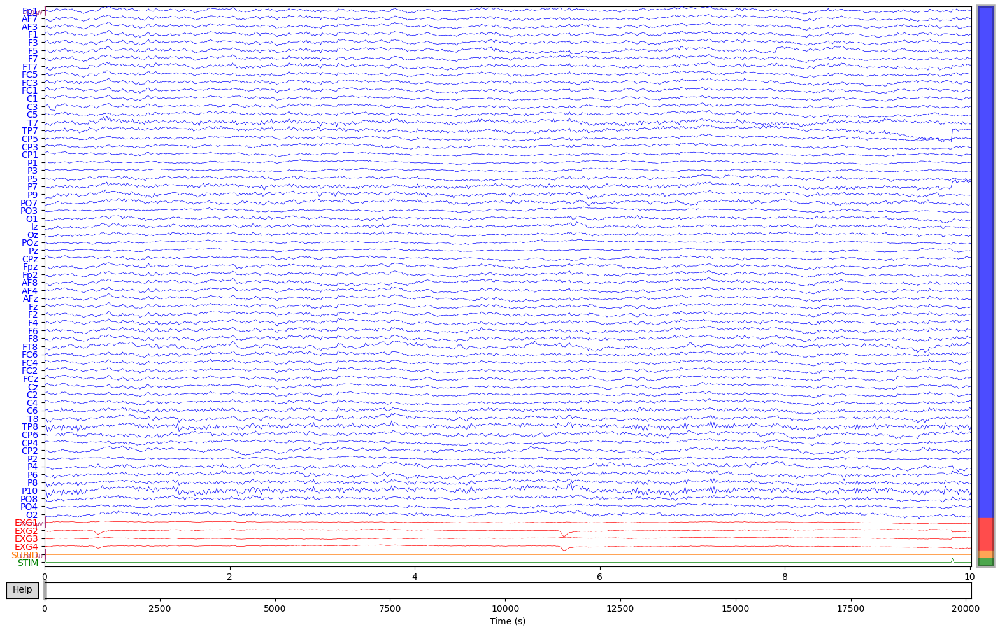

<RawArray | 70 x 1287638 (20119.3 s), ~687.8 MB, data loaded>

In [28]:
all_preprocessed = mne.io.RawArray(np.concatenate(all_musics_data, axis=1).astype('object'), preprocessed.info)
# .astype('object') is a workaround solution for an error with numpy version
all_preprocessed.add_channels([subid_raw], force_update_info=True)
all_preprocessed.rename_channels({'STI 014': 'STIM'})

color = dict(eeg='blue', eog='red', stim='green', misc='tab:orange')
all_preprocessed.plot(n_channels=70, color=color);
all_preprocessed

In [29]:
all_events = mne.find_events(all_preprocessed)
all_events[:10]

Trigger channel has a non-zero initial value of 1211 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1619 events found
Event IDs: [ 111  112  121  122  131  132  211  212  221  222  231  232  311  312
  321  322  331  332  411  412  421  422  431  432 1111 1112 1121 1122
 1131 1132 1211 1212 1221 1222 1231 1232 1311 1312 1321 1322 1331 1332
 1411 1412 1421 1422 1431 1432 2111 2112 2121 2122 2131 2132 2211 2212
 2221 2222 2231 2232 2311 2312 2321 2322 2331 2332 2411 2412 2421 2422
 2431 2432]


array([[ 628,    0, 1221],
       [1256,    0, 1231],
       [1718,    0,  311],
       [2485,    0,  321],
       [3252,    0,  331],
       [3715,    0, 2311],
       [4454,    0, 2321],
       [5193,    0, 2331],
       [5656,    0, 1311],
       [6380,    0, 1321]], dtype=int64)

## Save

In [30]:
all_preprocessed.save('omiir_all_preprocessed.fif', overwrite=True)

Overwriting existing file.
Writing D:\Code\BrainCodeCamp\Project\omiir_all_preprocessed.fif


C:\Users\Paul\AppData\Local\Temp\ipykernel_191872\3962001015.py:1: RuntimeWarning: This filename (D:\Code\BrainCodeCamp\Project\omiir_all_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  all_preprocessed.save('omiir_all_preprocessed.fif', overwrite=True)


Closing D:\Code\BrainCodeCamp\Project\omiir_all_preprocessed.fif
[done]


## Load

In [31]:
# all_preprocessed = mne.io.read_raw_fif('omiir_all_preprocessed.fif')

## Get Events

In [32]:
all_events = mne.find_events(all_preprocessed)

eid_perception = []
eid_imagination = []
eid_imagination_woc = []
for _, _, eid in all_events:
    _, trial_type, _ = sep_eid_v2(eid)
    if trial_type == 1:
        eid_perception.append(eid)
    elif trial_type == 2:
        eid_imagination.append(eid)
    elif trial_type == 3:
        eid_imagination_woc.append(eid)

evt_perception = events[np.isin(events[:, 2], eid_perception)]
evt_imagination = events[np.isin(events[:, 2], eid_imagination)]
evt_imagination_woc = events[np.isin(events[:, 2], eid_imagination_woc)]
evt_all = events[np.isin(events[:, 2], eid_perception + eid_imagination + eid_imagination_woc)]
print('#Perception:', len(evt_perception), ', #Imagination', len(evt_imagination), ', #Imagination w/o cue', len(evt_imagination_woc))

Trigger channel has a non-zero initial value of 1211 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
1619 events found
Event IDs: [ 111  112  121  122  131  132  211  212  221  222  231  232  311  312
  321  322  331  332  411  412  421  422  431  432 1111 1112 1121 1122
 1131 1132 1211 1212 1221 1222 1231 1232 1311 1312 1321 1322 1331 1332
 1411 1412 1421 1422 1431 1432 2111 2112 2121 2122 2131 2132 2211 2212
 2221 2222 2231 2232 2311 2312 2321 2322 2331 2332 2411 2412 2421 2422
 2431 2432]
#Perception: 60 , #Imagination 60 , #Imagination w/o cue 60


# Explore Beat

In [33]:
def get_events_by_type(events, event_type):
    '''
        event_type: 'onset', 'beat', 'onset_woc', 'beat_woc'
    '''
    lst = []
    for start, _, eid in events:
        mid, trial_type, version = sep_eid_v2(eid)
        adjusted = np.round(musics[version][mid][event_type]/musics[version][mid]['rate']*sfreq + start).astype(int) # Music-sr > EEG-freq + Start
        lst.append(adjusted)
    lst = np.concatenate(lst)
    event = np.zeros((lst.shape[0], 3), dtype=int)
    event[:, 0] = lst
    
    return event

In [34]:
tmin__ = -.2
tmax__ = .25

Not setting metadata
1835 matching events found
Setting baseline interval to [-0.203125, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Not setting metadata
1835 matching events found
Setting baseline interval to [-0.203125, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Not setting metadata
1835 matching events found
Setting baseline interval to [-0.203125, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


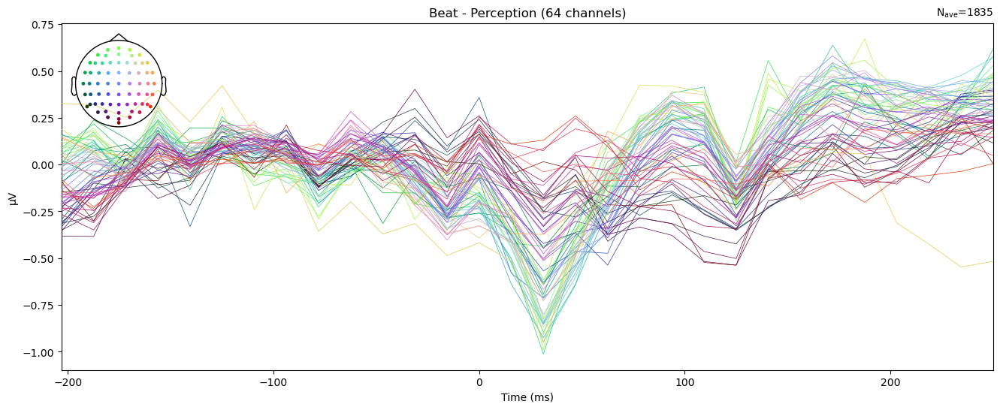

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


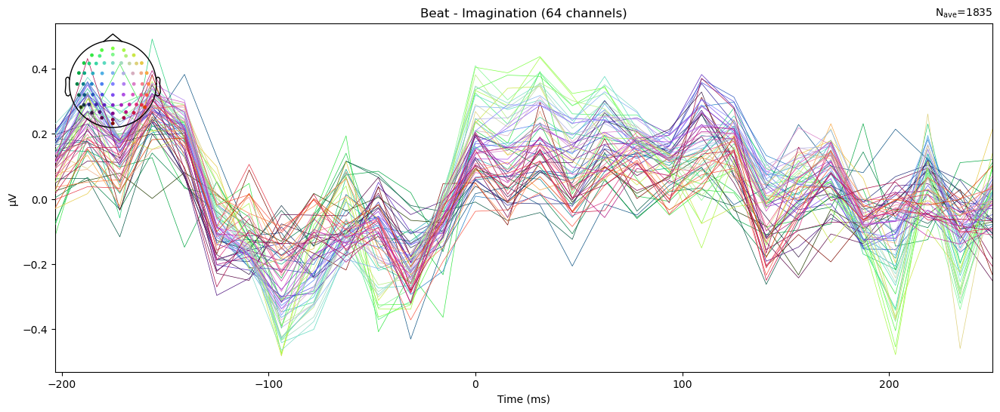

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


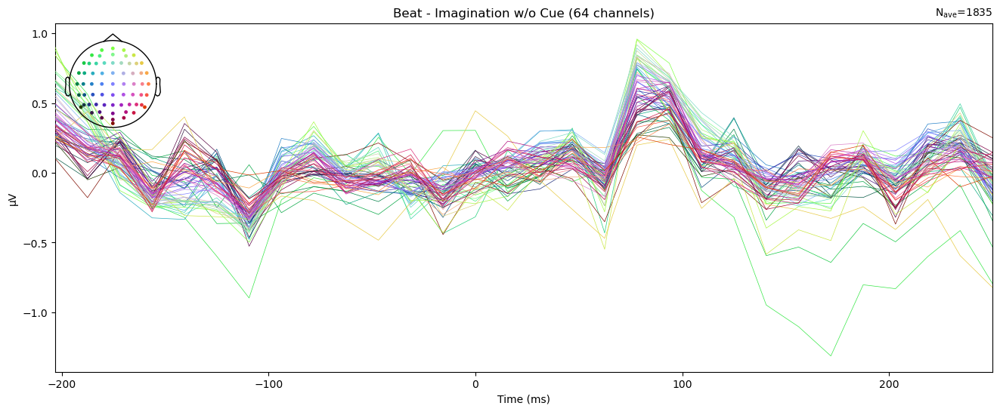

In [35]:
ex_perception_beat = mne.Epochs(preprocessed, get_events_by_type(evt_perception, 'beat'), tmin=tmin__, tmax=tmax__, event_repeated='drop')
ex_imagination_beat = mne.Epochs(preprocessed, get_events_by_type(evt_imagination, 'beat'), tmin=tmin__, tmax=tmax__, event_repeated='drop')
ex_imagination_woc_beat = mne.Epochs(preprocessed, get_events_by_type(evt_imagination_woc, 'beat'), tmin=tmin__, tmax=tmax__, event_repeated='drop')

fig1 = plt.figure(figsize=(16, 6))
ax1 = fig1.subplots()
ex_perception_beat.average(picks='data').plot(titles='Beat - Perception', time_unit='ms', axes=ax1);

fig2 = plt.figure(figsize=(16, 6))
ax2 = fig2.subplots()
ex_imagination_beat.average(picks='data').plot(titles='Beat - Imagination', time_unit='ms', axes=ax2);

fig3 = plt.figure(figsize=(16, 6))
ax3 = fig3.subplots()
ex_imagination_woc_beat.average(picks='data').plot(titles='Beat - Imagination w/o Cue', time_unit='ms', axes=ax3);

# Explore Onset

Not setting metadata
3085 matching events found
Setting baseline interval to [-0.203125, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Not setting metadata
3085 matching events found
Setting baseline interval to [-0.203125, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Not setting metadata
3085 matching events found
Setting baseline interval to [-0.203125, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


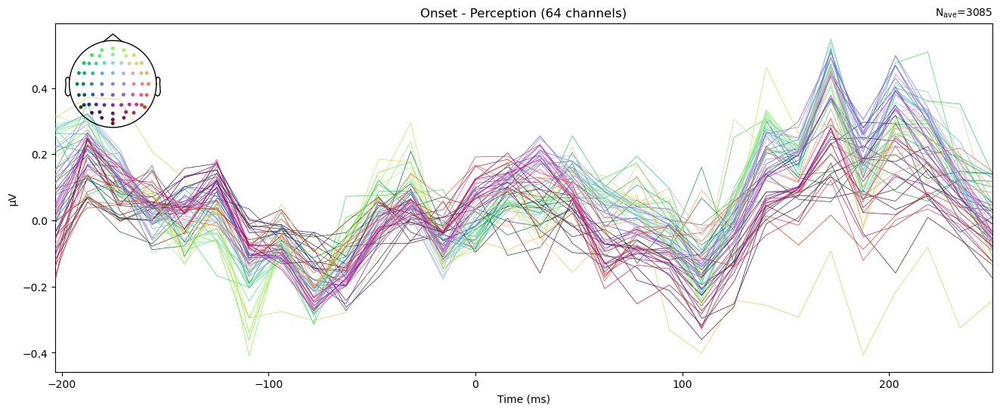

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


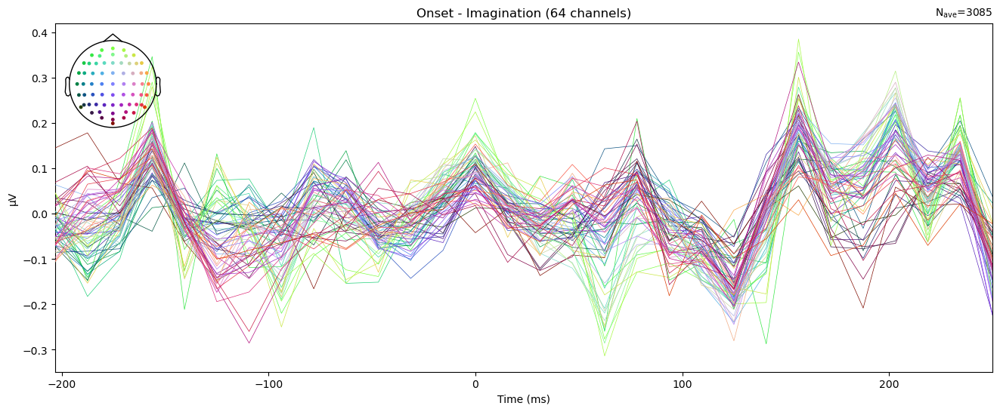

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


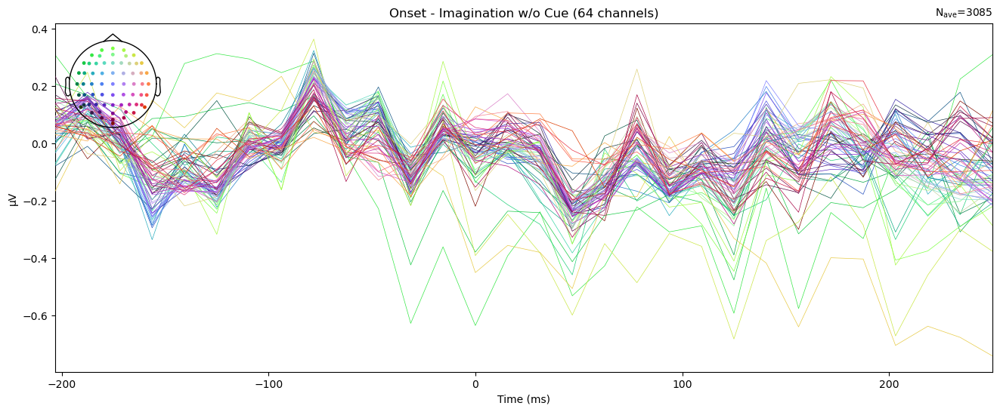

In [36]:
ex_perception_onset = mne.Epochs(preprocessed, get_events_by_type(evt_perception, 'onset'), tmin=tmin__, tmax=tmax__, event_repeated='drop')
ex_imagination_onset = mne.Epochs(preprocessed, get_events_by_type(evt_imagination, 'onset'), tmin=tmin__, tmax=tmax__, event_repeated='drop')
ex_imagination_woc_onset = mne.Epochs(preprocessed, get_events_by_type(evt_imagination_woc, 'onset'), tmin=tmin__, tmax=tmax__, event_repeated='drop')

fig1 = plt.figure(figsize=(16, 6))
ax1 = fig1.subplots()
ex_perception_onset.average(picks='data').plot(titles='Onset - Perception', time_unit='ms', axes=ax1);

fig2 = plt.figure(figsize=(16, 6))
ax2 = fig2.subplots()
ex_imagination_onset.average(picks='data').plot(titles='Onset - Imagination', time_unit='ms', axes=ax2);

fig3 = plt.figure(figsize=(16, 6))
ax3 = fig3.subplots()
ex_imagination_woc_onset.average(picks='data').plot(titles='Onset - Imagination w/o Cue', time_unit='ms', axes=ax3);